In [24]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive


In [25]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [26]:
!nvidia-smi

Sat Jan 30 12:51:30 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P0    27W /  70W |    227MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [27]:
%cd '/gdrive/My Drive/Tavsiye_Sistemi/'

/gdrive/My Drive/Tavsiye_Sistemi


In [28]:
!ls


 file_mapping
 images
 info
 lib
 logs
 output
 __pycache__
 Recommendation.ipynb
'ssrco,chiffon_top,womens,black,front,square_product,x600-bg,f8f8f8.1 - 2021-01-05T205553.621.jpg'
 style_stack.py
 Tshirt10.jpg
 tshirt1.jpg
 Tshirt1.jpg
 tshirt2.jpg
 Tshirt2.jpg
 tshirt3.jpg
 Tshirt3.jpg
 tshirt4.jpg
 Tshirt4.jpg
 Tshirt5.jpg
 Tshirt6.jpg
 tshirt7.jpg
 Tshirt7.jpg
 tshirt8.jpg
 Tshirt8.jpg
 Tshirt9.jpg
 utils.py
 vgg16_tshirt_classifier_1129.h5
 vgg16_tshirt_classifier.h5
 vgg_classifier.ipynb


In [29]:
!python utils.py

2021-01-30 12:51:40.932278: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [30]:
!wget  https://anaconda.org/pytorch/faiss-gpu/1.2.1/download/linux-64/faiss-gpu-1.2.1-py36_cuda9.0.176_1.tar.bz2

--2021-01-30 12:51:44--  https://anaconda.org/pytorch/faiss-gpu/1.2.1/download/linux-64/faiss-gpu-1.2.1-py36_cuda9.0.176_1.tar.bz2
Resolving anaconda.org (anaconda.org)... 104.17.92.24, 104.17.93.24, 2606:4700::6811:5c18, ...
Connecting to anaconda.org (anaconda.org)|104.17.92.24|:443... connected.
HTTP request sent, awaiting response... 302 FOUND
Location: https://binstar-cio-packages-prod.s3.amazonaws.com/5a15c9cc393ec612061f033a/5ac54beae586bb11ec0ace46?response-content-disposition=attachment%3B%20filename%3D%22faiss-gpu-1.2.1-py36_cuda9.0.176_1.tar.bz2%22%3B%20filename%2A%3DUTF-8%27%27faiss-gpu-1.2.1-py36_cuda9.0.176_1.tar.bz2&response-content-type=application%2Fx-tar&X-Amz-Algorithm=AWS4-HMAC-SHA256&X-Amz-Expires=60&X-Amz-Date=20210130T125144Z&X-Amz-SignedHeaders=host&X-Amz-Security-Token=IQoJb3JpZ2luX2VjEKD%2F%2F%2F%2F%2F%2F%2F%2F%2F%2FwEaCXVzLWVhc3QtMSJHMEUCIQDyhJOuYVZs0kTVuQbzy%2BrDhVVeeeDSL%2FTn5rLOcDSpWAIgVJPA9neHBLGN2m1UXj2YZgLSw49v9osHZu9LGT%2BKW3QqvQMIiP%2F%2F%2F%2F%2F%2F%

In [31]:
!tar xvjf faiss-gpu-1.2.1-py36_cuda9.0.176_1.tar.bz2

info/hash_input.json
info/has_prefix
info/index.json
info/files
info/LICENSE.txt
info/about.json
info/paths.json
info/git
lib/python3.6/site-packages/faiss-0.1-py3.6.egg-info/dependency_links.txt
lib/python3.6/site-packages/faiss-0.1-py3.6.egg-info/not-zip-safe
lib/python3.6/site-packages/faiss-0.1-py3.6.egg-info/requires.txt
lib/python3.6/site-packages/faiss-0.1-py3.6.egg-info/top_level.txt
info/test/run_test.py
lib/python3.6/site-packages/faiss-0.1-py3.6.egg-info/native_libs.txt
info/test/run_test.sh
info/test/tests/run_tests.sh
lib/python3.6/site-packages/faiss-0.1-py3.6.egg-info/SOURCES.txt
info/recipe/conda_build_config.yaml
info/recipe/build.sh
info/test/tests/CMakeLists.txt
info/test/tests/Makefile
info/recipe/meta.yaml.template
lib/python3.6/site-packages/faiss-0.1-py3.6.egg-info/PKG-INFO
info/test/tests/test_factory.py
info/test/tests/test_ivfpq_codec.cpp
info/recipe/meta.yaml
info/recipe/setup.py
info/test/tests/test_blas.cpp
info/recipe/makefile.inc
info/test/tests/test_ivfp

In [32]:
!cp -r lib/python3.6/site-packages/* /usr/local/lib/python3.6/dist-packages/

In [33]:
!pip install mkl

In [34]:
!python style_stack.py

2021-01-30 12:52:06.118074: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [35]:
import numpy as np
import pandas as pd
import tensorflow as tf
import pathlib
from skimage.io import imread
from skimage.transform import resize
import PIL
import pickle
from sklearn.neighbors import NearestNeighbors
import matplotlib.image as mpimg
import tensorflow as tf
print(tf.__version__)
from style_stack import StyleStack
from PIL import Image, ImageOps
from tensorflow.keras.preprocessing import image


2.4.1


In [36]:
import glob
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
import itertools
import faiss
from utils import *
import pickle


## Loading Model

In [37]:
data_dir = pathlib.Path('/gdrive/My Drive/Tavsiye_Sistemi/images')

IMG_SIZE = (224, 224)
batch_size = 50

preprocess_input = tf.keras.applications.vgg16.preprocess_input

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=30,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow_from_directory(
    data_dir,
    subset='training',
    target_size=IMG_SIZE,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    subset='validation',
    target_size=IMG_SIZE,
    batch_size=batch_size,
    class_mode='categorical'
)

Found 3201 images belonging to 10 classes.
Found 800 images belonging to 10 classes.


In [38]:
weights_file = '/gdrive/My Drive/Tavsiye_Sistemi/vgg16_tshirt_classifier.h5'

base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))

58892288/58889256 [==============================] - 0s 0us/step


In [39]:
x = base_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, activation='relu', name='fc1')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(4096, activation='relu', name='fc2')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(10, activation='softmax')(x)
model = tf.keras.Model(inputs=base_model.input, outputs=x)

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.categorical_crossentropy,
              metrics=['accuracy'])

model.load_weights(weights_file)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

## Preparing Image Path

PATH: ['/gdrive/My Drive/Tavsiye_Sistemi/images/Man Active/ssrco,active_tshirt,mens,101010_01c5ca27c6,front,square_product,600x600.u2.jpg', '/gdrive/My Drive/Tavsiye_Sistemi/images/Man Active/ssrco,active_tshirt,mens,101010_01c5ca27c6,front,square_product,600x600.u2 (1).jpg', '/gdrive/My Drive/Tavsiye_Sistemi/images/Man Active/ssrco,active_tshirt,mens,101010_01c5ca27c6,front,square_product,600x600.u8.jpg', '/gdrive/My Drive/Tavsiye_Sistemi/images/Man Active/ssrco,active_tshirt,mens,101010_01c5ca27c6,front,square_product,600x600.u2 (2).jpg', '/gdrive/My Drive/Tavsiye_Sistemi/images/Man Active/ssrco,active_tshirt,mens,101010_01c5ca27c6,front,square_product,600x600.u5.jpg', '/gdrive/My Drive/Tavsiye_Sistemi/images/Man Active/ssrco,active_tshirt,mens,101010_01c5ca27c6,front,square_product,600x600.u3.jpg', '/gdrive/My Drive/Tavsiye_Sistemi/images/Man Active/ssrco,active_tshirt,mens,101010_01c5ca27c6,front,square_product,600x600.u2 (4).jpg', '/gdrive/My Drive/Tavsiye_Sistemi/images/Man Activ

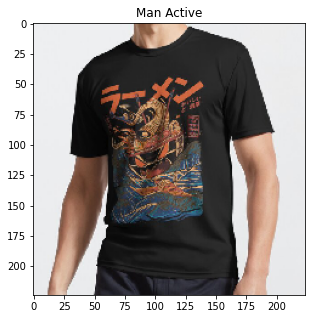

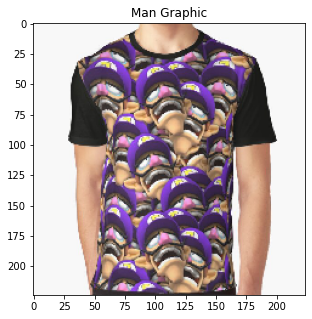

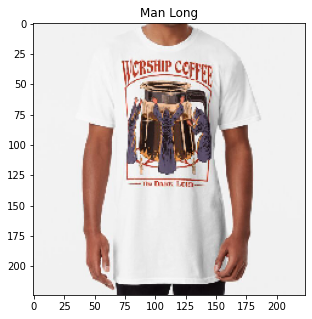

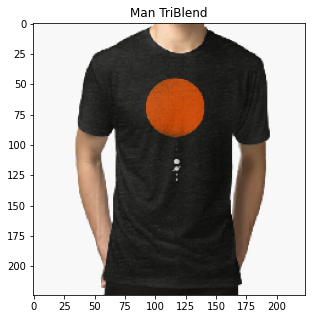

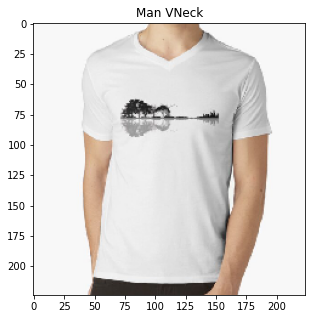

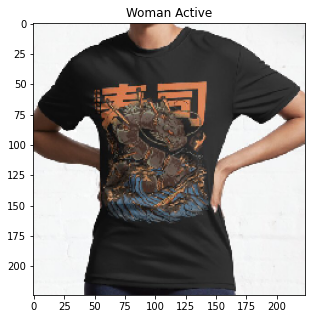

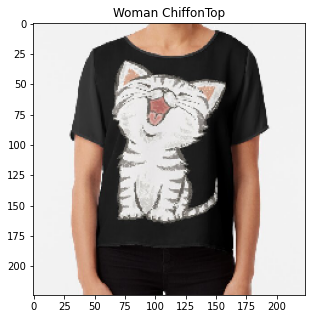

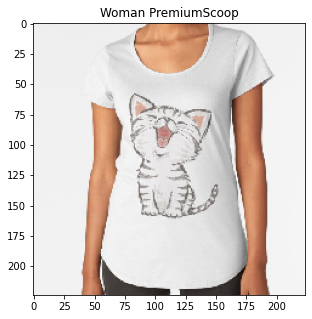

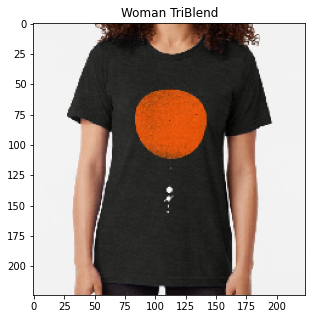

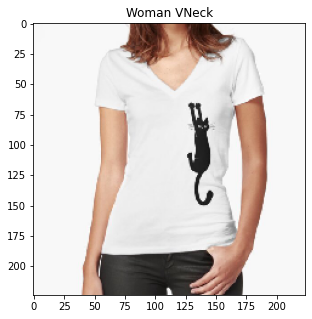

In [40]:
data_dir = pathlib.Path('/gdrive/My Drive/Tavsiye_Sistemi/images')

def get_img_by_class(dir_, class_list):
    img_by_class = {}
    for class_ in class_list:
        paths = glob.glob(os.path.join(dir_, f'{class_}/*'))
        print("PATH:", paths)
        img_by_class[class_] = paths
    return img_by_class


def preview_img_by_class(img_by_class):
    for class_, paths in img_by_class.items():
        img, _ = load_image(paths[0], (224, 224))
        plt.figure(figsize = (5, 5))
        plt.imshow(img)
        plt.title(class_)

dir_ = '/gdrive/My Drive/Tavsiye_Sistemi/images/'

styles = [
    'Man Active',
    'Man Graphic',
    'Man Long',
    'Man TriBlend',
    'Man VNeck',
    'Woman Active',
    'Woman ChiffonTop',
    'Woman PremiumScoop',
    'Woman TriBlend',
    'Woman VNeck'
]
                          
art_by_style = get_img_by_class(dir_, styles)
preview_img_by_class(art_by_style)

Predicted Objects and Probabilities
Man Active 0.0
Man Graphic 0.0
Man Long 0.0
Man TriBlend 0.0
Man VNeck 1.0
Woman Active 0.0
Woman ChiffonTop 0.0
Woman PremiumScoop 0.0
Woman TriBlend 0.0
Woman VNeck 0.0


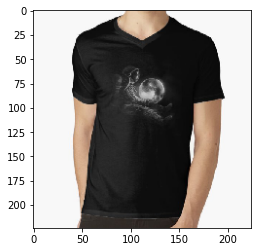

In [41]:
classes = [
    'Man Active',
    'Man Graphic',
    'Man Long',
    'Man TriBlend',
    'Man VNeck',
    'Woman Active',
    'Woman ChiffonTop',
    'Woman PremiumScoop',
    'Woman TriBlend',
    'Woman VNeck'
    ]
img, x = load_image(art_by_style['Man VNeck'][2], (224, 224))
plt.imshow(img)
predictions = model.predict(x)
print('Predicted Objects and Probabilities')
for class_, prob in zip(classes, *predictions):
    print(class_, prob)


## Recommendations

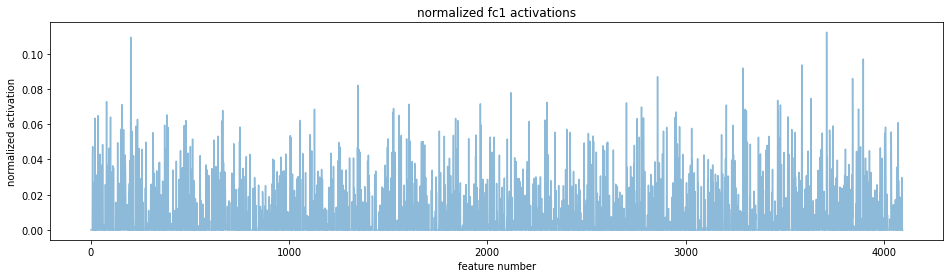

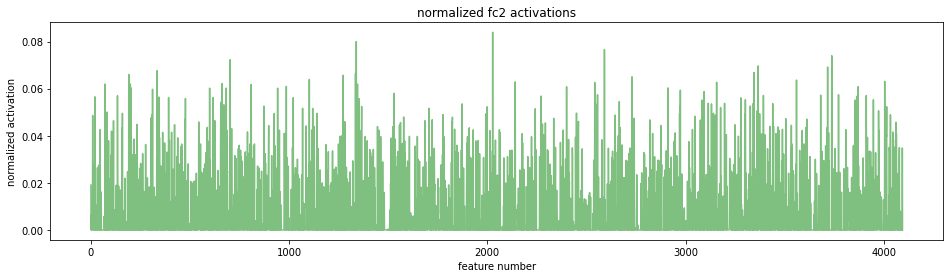

In [42]:
fc1_extractor = tf.keras.Model(inputs=model.input, outputs=model.get_layer('fc1').output)
fc2_extractor = tf.keras.Model(inputs=model.input, outputs=model.get_layer('fc2').output)
fc1_a = fc1_extractor.predict(x)
fc2_a = fc2_extractor.predict(x)
fc1_norm = preprocessing.normalize(fc1_a, norm='l2')
fc2_norm = preprocessing.normalize(fc2_a, norm='l2')
plt.figure(figsize=(16, 4))
plt.plot(fc1_norm[0], alpha=0.5)
plt.title('normalized fc1 activations')
plt.xlabel('feature number')
plt.ylabel('normalized activation')
plt.figure(figsize=(16, 4))
plt.plot(fc2_norm[0], color='green', alpha=0.5)
plt.title('normalized fc2 activations')
plt.xlabel('feature number')
plt.ylabel('normalized activation')
plt.show()

In [43]:
all_paths = [path for paths in list(art_by_style.values()) for path in paths]
file_mapping = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_2 = fc2_extractor.predict(X)
V_1_norm = preprocessing.normalize(V_1, norm='l2')
V_2_norm = preprocessing.normalize(V_2, norm='l2')

## Extract Features and Normalize Vectors for Specific T-shirt Classes

In [44]:
all_paths = [path for path in list(art_by_style['Man Active'])]
file_mapping_man_active = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_man_active = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_man_active, open('file_mapping/Man Active/file_mapping_man_active.p', 'wb'))
pickle.dump(V_1_norm_man_active, open('file_mapping/Man Active/V_1_norm_man_active.p', 'wb'))

In [45]:
all_paths = [path for path in list(art_by_style['Man Graphic'])]
file_mapping_man_graphic = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_man_graphic = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_man_graphic, open('file_mapping/Man Graphic/file_mapping_man_graphic.p', 'wb'))
pickle.dump(V_1_norm_man_graphic, open('file_mapping/Man Graphic/V_1_norm_man_graphic.p', 'wb'))

In [46]:
all_paths = [path for path in list(art_by_style['Man Long'])]
file_mapping_man_long = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_man_long = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_man_long, open('file_mapping/Man Long/file_mapping_man_long.p', 'wb'))
pickle.dump(V_1_norm_man_long, open('file_mapping/Man Long/V_1_norm_man_long.p', 'wb'))


In [47]:
all_paths = [path for path in list(art_by_style['Man TriBlend'])]
file_mapping_man_triBlend = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_man_triBlend = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_man_triBlend, open('file_mapping/Man TriBlend/file_mapping_man_triBlend.p', 'wb'))
pickle.dump(V_1_norm_man_triBlend, open('file_mapping/Man TriBlend/V_1_norm_man_triBlend.p', 'wb'))


In [48]:
all_paths = [path for path in list(art_by_style['Man VNeck'])]
file_mapping_man_vNeck = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_man_vNeck = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_man_vNeck, open('file_mapping/Man VNeck/file_mapping_man_vNeck.p', 'wb'))
pickle.dump(V_1_norm_man_vNeck, open('file_mapping/Man VNeck/V_1_norm_man_vNeck.p', 'wb'))


In [49]:
all_paths = [path for path in list(art_by_style['Woman Active'])]
file_mapping_woman_active = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_woman_active = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_woman_active, open('file_mapping/Woman Active/file_mapping_woman_active.p', 'wb'))
pickle.dump(V_1_norm_woman_active, open('file_mapping/Woman Active/V_1_norm_woman_active.p', 'wb'))


In [50]:
all_paths = [path for path in list(art_by_style['Woman PremiumScoop'])]
file_mapping_woman_premiumScoop = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_woman_premiumScoop = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_woman_premiumScoop, open('file_mapping/Woman PremiumScoop/file_mapping_woman_premiumScoop.p', 'wb'))
pickle.dump(V_1_norm_woman_premiumScoop, open('file_mapping/Woman PremiumScoop/V_1_norm_woman_premiumScoop.p', 'wb'))


In [51]:
all_paths = [path for path in list(art_by_style['Woman ChiffonTop'])]
file_mapping_woman_chiffonTop = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_woman_chiffonTop = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_woman_chiffonTop, open('file_mapping/Woman ChiffonTop/file_mapping_woman_chiffonTop.p', 'wb'))
pickle.dump(V_1_norm_woman_chiffonTop, open('file_mapping/Woman ChiffonTop/V_1_norm_woman_chiffonTop.p', 'wb'))

In [52]:
all_paths = [path for path in list(art_by_style['Woman TriBlend'])]
file_mapping_woman_triBlend = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_woman_triBlend = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_woman_triBlend, open('file_mapping/Woman TriBlend/file_mapping_woman_triBlend.p', 'wb'))
pickle.dump(V_1_norm_woman_triBlend, open('file_mapping/Woman TriBlend/V_1_norm_woman_triBlend.p', 'wb'))


In [53]:
all_paths = [path for path in list(art_by_style['Woman VNeck'])]
file_mapping_woman_vNeck = {i: path for i, path in enumerate(all_paths)}
x_list = [load_image(path, model.input_shape[1:3])[1] for path in all_paths]
X = np.vstack(x_list)
# extract features and normalize vectors
V_1 = fc1_extractor.predict(X)
V_1_norm_woman_vNeck = preprocessing.normalize(V_1, norm='l2')

pickle.dump(file_mapping_woman_vNeck, open('file_mapping/Woman VNeck/file_mapping_woman_vNeck.p', 'wb'))
pickle.dump(V_1_norm_woman_vNeck, open('file_mapping/Woman VNeck/V_1_norm_woman_vNeck.p', 'wb'))


## Testing 

In [54]:
def similarity_search(V, v_query, file_mapping, n_results=11):
    v_query = np.expand_dims(v_query, axis=0)
    d = V.shape[1]
    index = faiss.IndexFlatIP(d)
    index.add(np.ascontiguousarray(V))
    distances, closest_indices = index.search(v_query, n_results)
    distances = distances.flatten()
    closest_indices = closest_indices.flatten()
    closest_paths = [file_mapping[idx] for idx in closest_indices]
    results_img = get_concatenated_images(closest_paths[1:])

    plt.figure(figsize=(50, 40))
    plt.imshow(results_img)
    plt.title(f'results similarities: {distances}')
    plt.show()

def image_upload(img, target_size):
    img = ImageOps.fit(img, target_size, Image.ANTIALIAS)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return img, x    

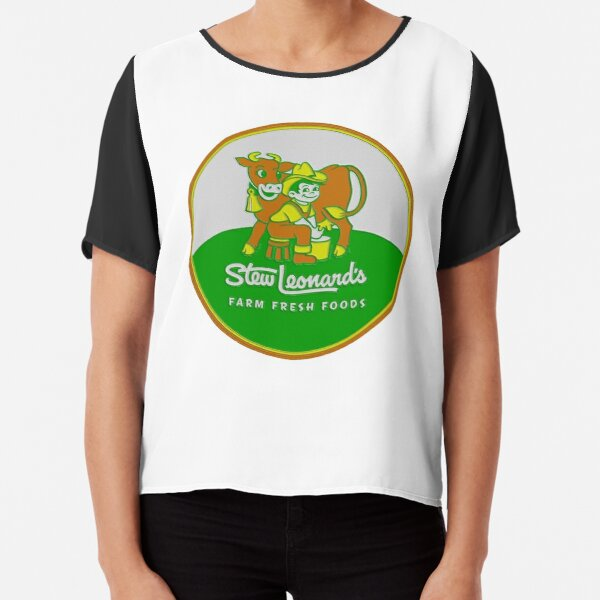

In [55]:
from IPython.display import Image
Image("tshirt7.jpg", width=400, height=400)

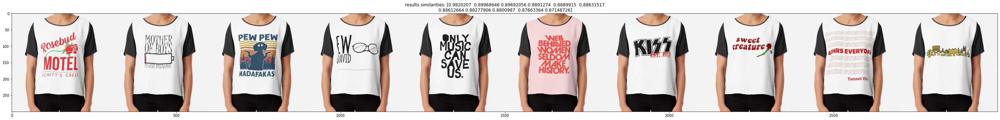

In [56]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('tshirt7.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

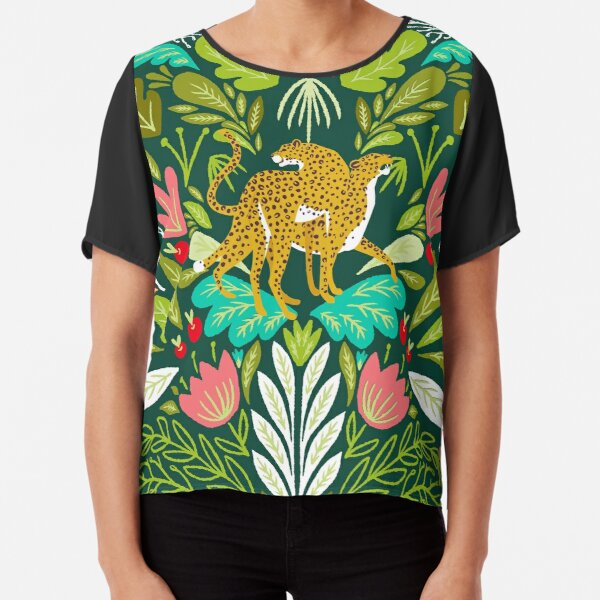

In [57]:
from IPython.display import Image
Image("tshirt8.jpg", width=400, height=400)

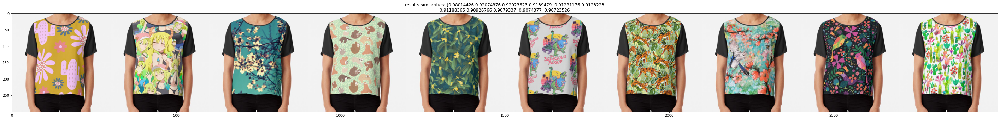

In [58]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('tshirt8.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

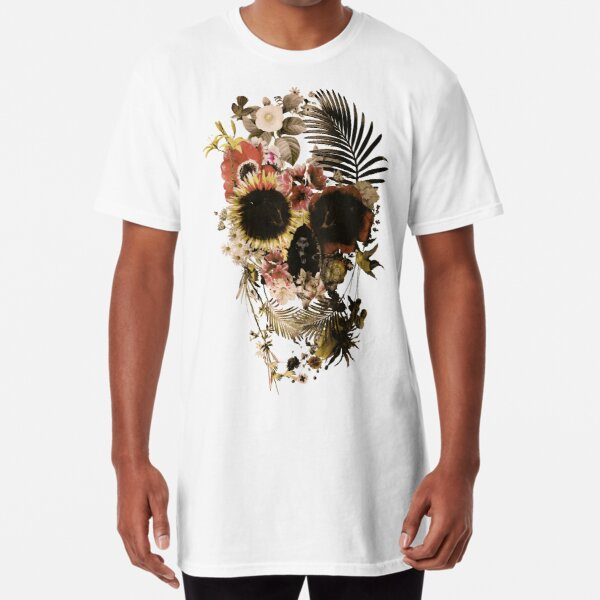

In [59]:
from IPython.display import Image
Image("tshirt4.jpg", width=400, height=400)

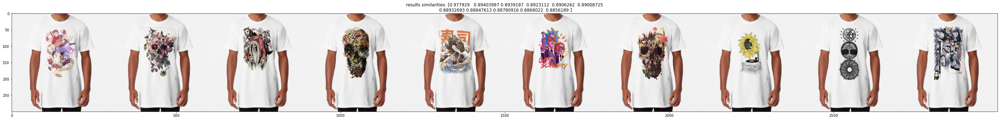

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('tshirt4.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

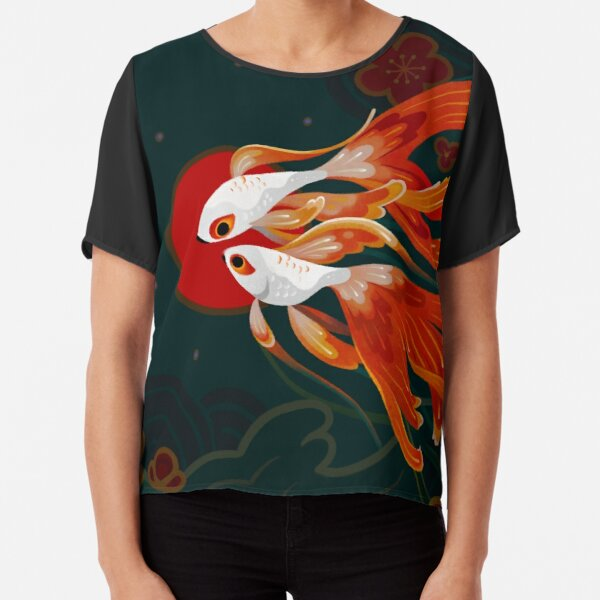

In [ ]:
from IPython.display import Image
Image("tshirt3.jpg", width=400, height=400)

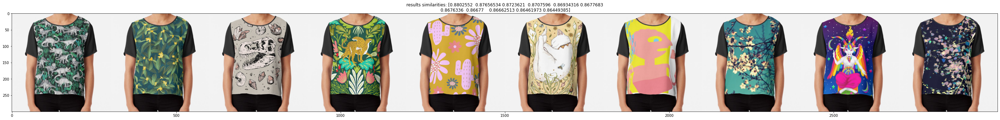

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('tshirt3.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

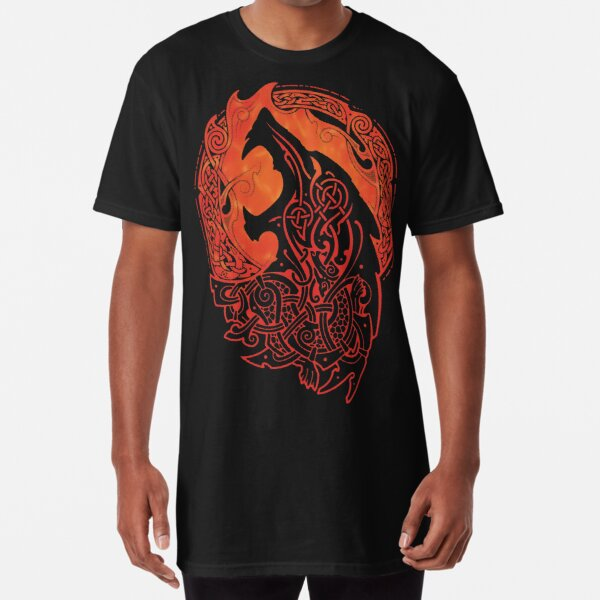

In [ ]:
from IPython.display import Image
Image("Tshirt1.jpg", width=400, height=400)

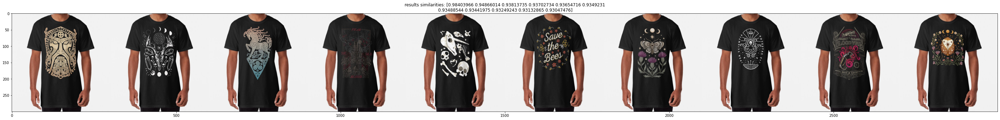

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt1.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)



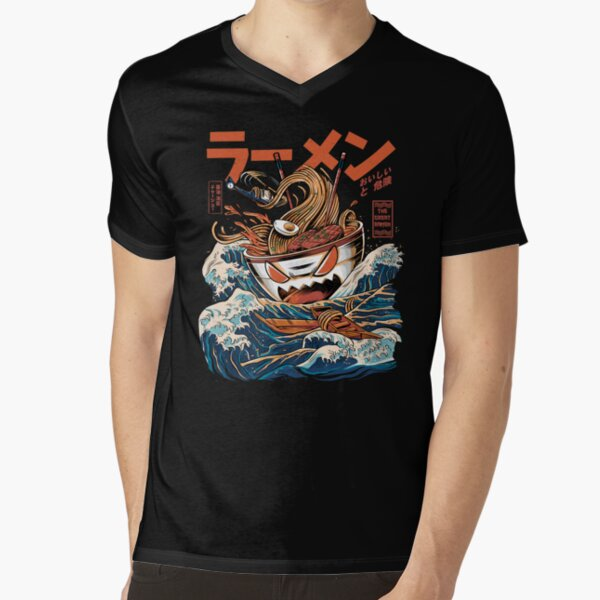

In [ ]:
from IPython.display import Image
Image("tshirt1.jpg", width=400, height=400)

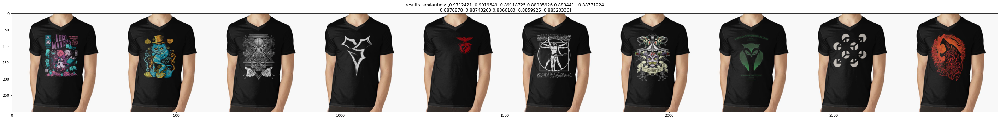

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('tshirt1.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

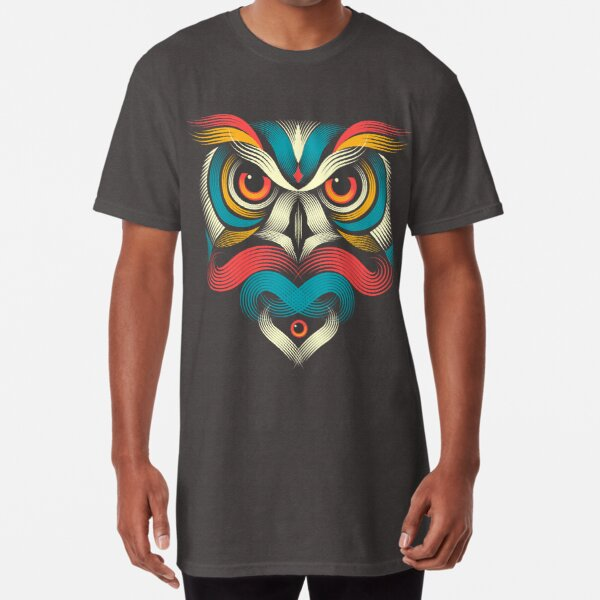

In [ ]:
from IPython.display import Image
Image("tshirt2.jpg", width=400, height=400)

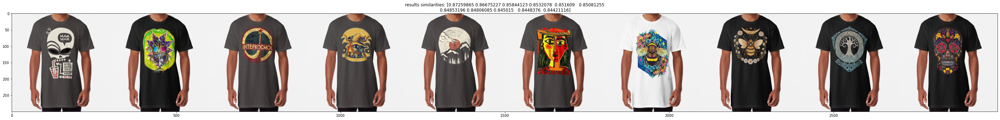

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('tshirt2.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

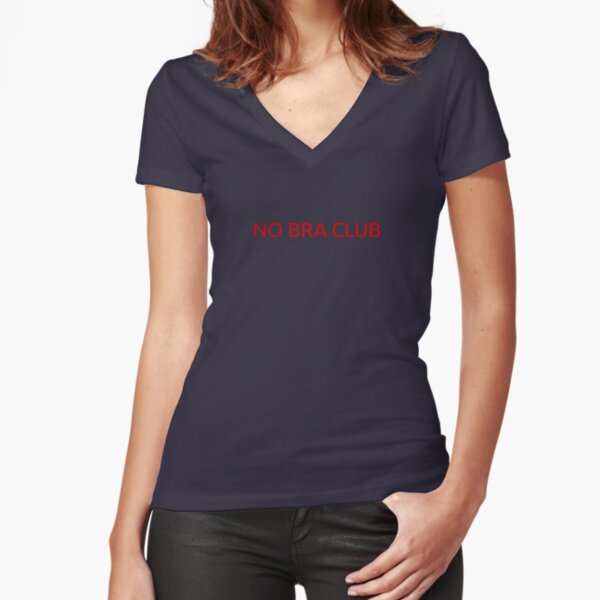

In [ ]:
from IPython.display import Image
Image("Tshirt3.jpg", width=400, height=400)

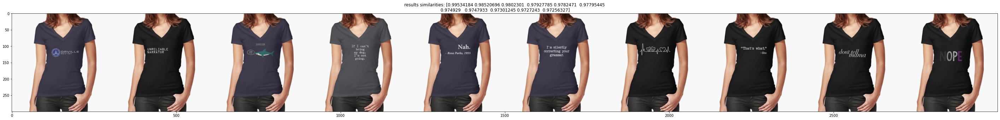

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt3.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

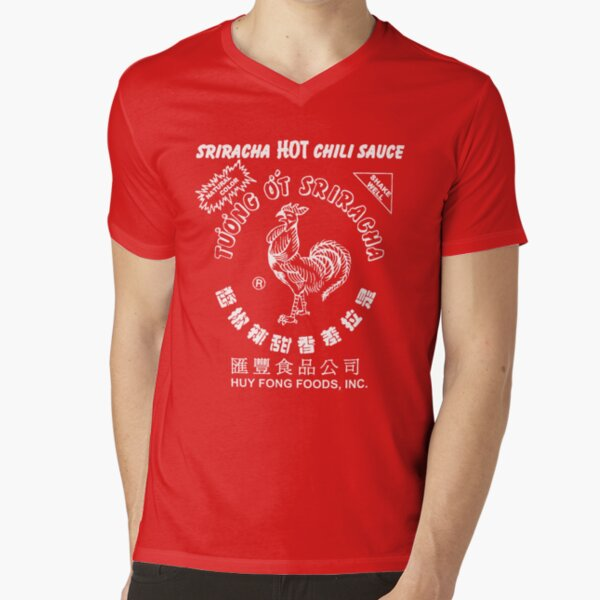

In [ ]:
from IPython.display import Image

Image("Tshirt4.jpg", width=400, height=400)

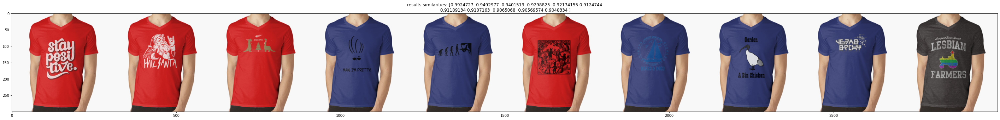

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt4.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

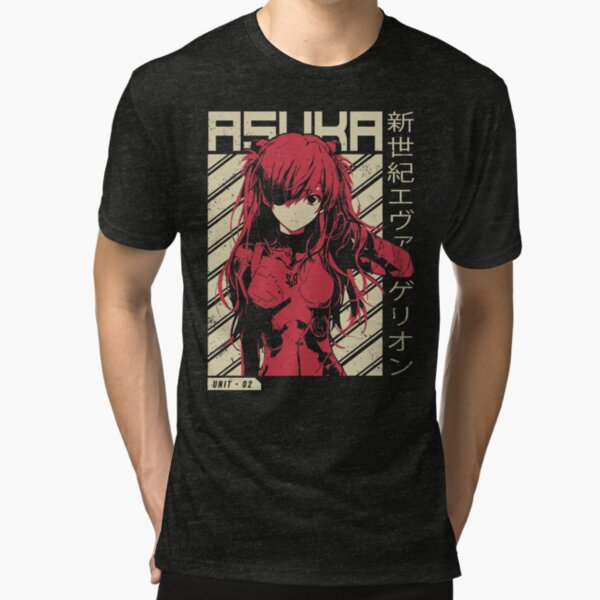

In [ ]:
from IPython.display import Image
Image("Tshirt5.jpg", width=400, height=400)

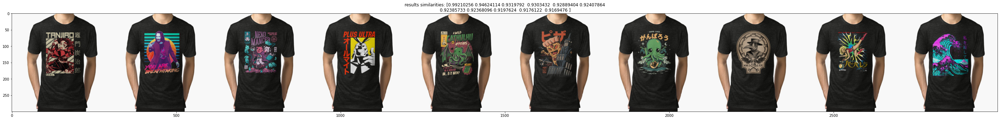

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt5.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

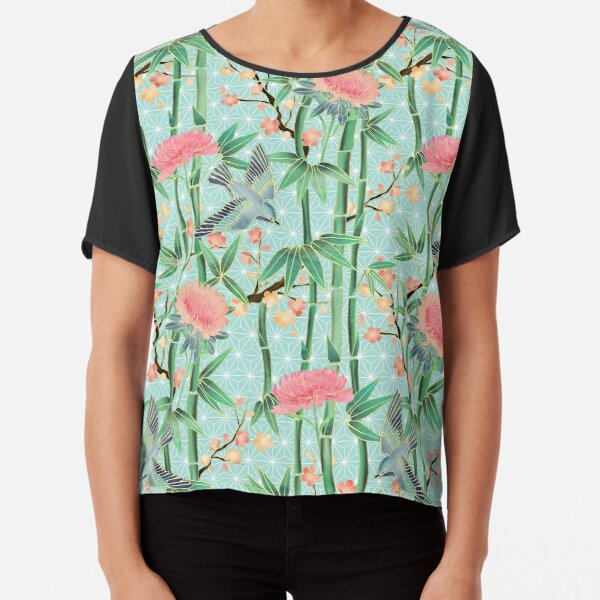

In [ ]:
from IPython.display import Image
Image("Tshirt6.jpg", width=400, height=400)

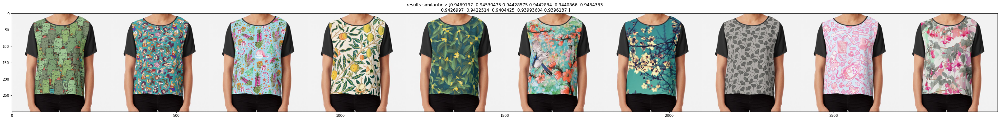

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt6.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

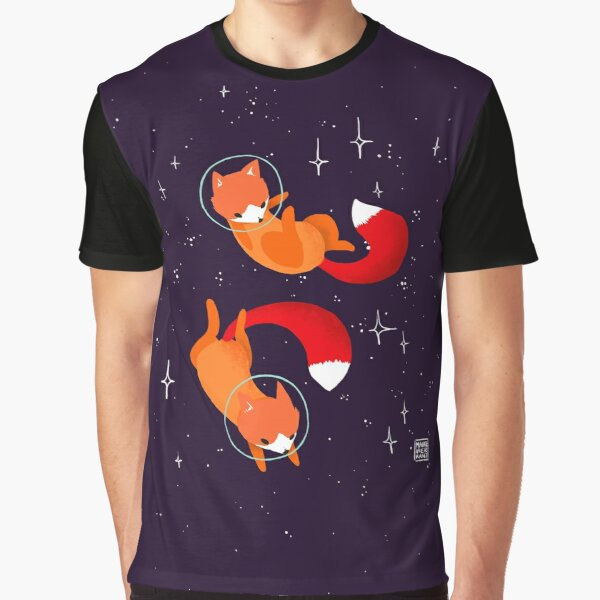

In [ ]:
from IPython.display import Image
Image("Tshirt7.jpg", width=400, height=400)

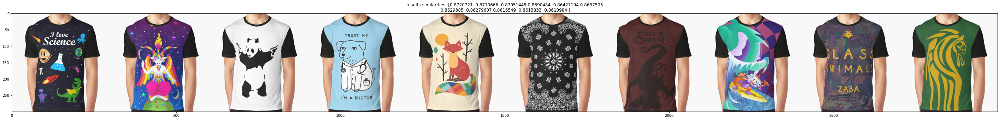

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt7.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

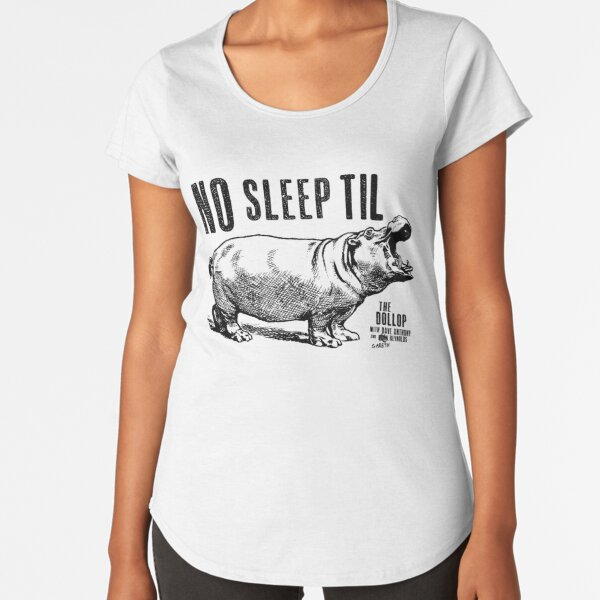

In [ ]:
from IPython.display import Image
Image("Tshirt8.jpg", width=400, height=400)

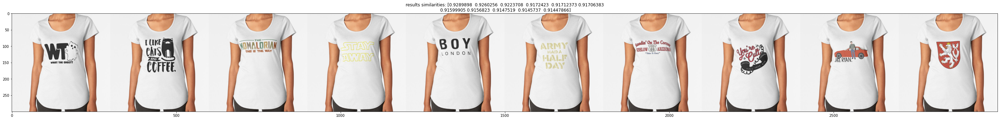

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt8.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

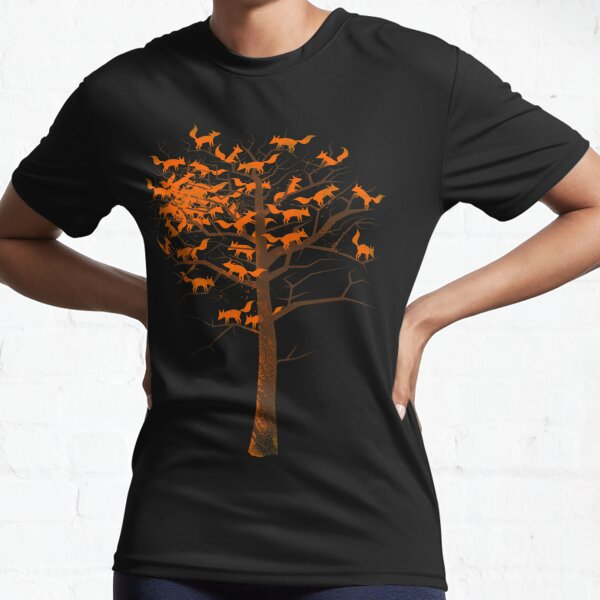

In [ ]:
from IPython.display import Image
Image("Tshirt9.jpg", width=400, height=400)

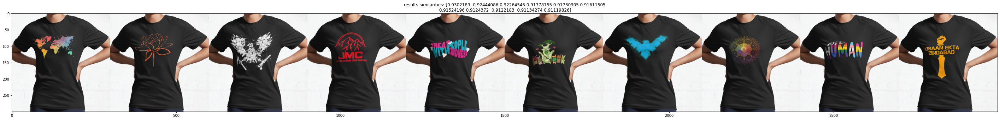

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt9.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)

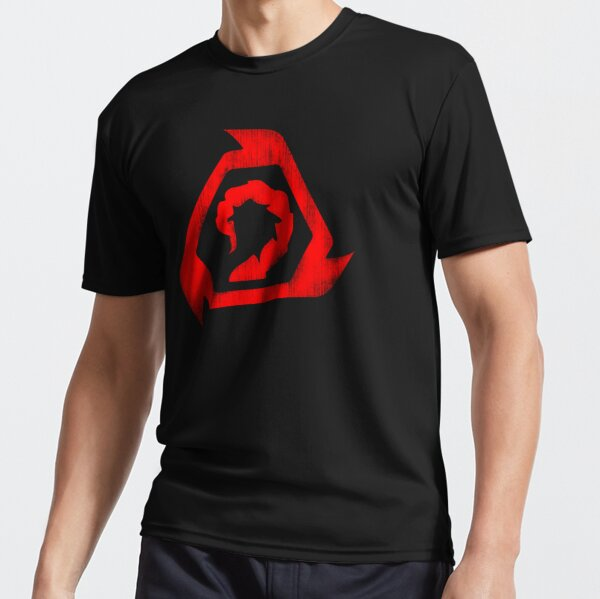

In [ ]:
from IPython.display import Image
Image("Tshirt10.jpg", width=400, height=400)

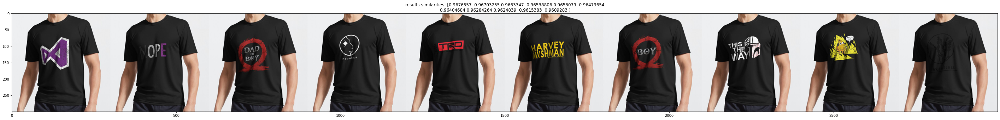

In [ ]:
from PIL import Image
compare = preprocessing.normalize(
        fc1_extractor.predict(image_upload(Image.open('Tshirt10.jpg'), model.input_shape[1:3])[1]), norm="l2",
    ).reshape(4096,)
similarity_search(V_1_norm, compare, file_mapping)